# Assignment 1: Implement Gaussian Mixture Model (GMM)

In this task, you are required to implement the GMM algorithm from scratch and apply it to the FIFA 23 Players Dataset and the EastWestAirlines Dataset for clustering. You should evaluate the performance of your clustering results using both qualitative and quantitative measures.

## Datasets
* **FIFA 23 Players Dataset**: This dataset contains detailed attributes of professional soccer players. The objective is to cluster players based on their skills and playing styles. Relevant features for clustering include:
  * Age
  * Overall rating (general skill level)
  * Potential (maximum projected skill level)
  * Value (market price in €)
  * Wage (weekly salary)
  * Shooting, Passing, Dribbling (technical abilities)
  * Defending, Physicality (defensive capabilities)

  You can download the dataset from Kaggle [FIFA 23 Dataset - Kaggle](https://www.kaggle.com/datasets/bryanb/fifa-player-stats-database?select=FIFA23_official_data.csv)

* **EastWestAirlines Dataset**: This dataset contains information about airline customers and their behaviors. You should preprocess the dataset as necessary before applying the clustering algorithm.

## Tasks

1. Implement the Gaussian Mixture Model algorithm from scratch. Do not use libraries like scikit-learn's GMM implementation for this part.
2. Fit the GMM to both datasets (FIFA 23 Players and EastWestAirlines) and perform clustering.
3. Evaluate your clustering results using the following methods:
   * **Rand Index**: Calculate the Rand Index to compare your clustering results against meaningful labels (e.g., player positions). Read more about the Rand Index here: [Rand Index - Wikipedia](https://en.wikipedia.org/wiki/Rand_index).
   * **Qualitative Evaluation**: For both datasets, visualize and describe the resulting clusters (e.g., scatter plots, pair plots, or other visualizations that highlight the formed groups). For visualizations in Python, you may refer to this guide: [Seaborn Visualization Library](https://seaborn.pydata.org/).

## Hints and Useful Links

* For a detailed explanation on how Gaussian Mixture Models work and how to implement them, see this tutorial: [Gaussian Mixture Model - scikit-learn documentation](https://scikit-learn.org/stable/modules/mixture.html).
* To understand the mathematical background and principles behind GMM, this reference may help: [Mixture Model - Wikipedia](https://en.wikipedia.org/wiki/Mixture_model).

## Solution 

> **Note** </br>
> The solution will be described in spanish.

### 1. Librerias y configuraciones previas

In [148]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import multivariate_normal
from sklearn.metrics import rand_score
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

### 2. Funciones

A continuación se colocan las funciones suministradas por el profesor.

In [191]:
# Function to generate a positive definite covariance matrix
def generate_positive_definite_matrix(d):
    A = np.random.randn(d, d)
    return np.dot(A, A.T) + np.eye(d) * epsilon  # Add identity for stability

# Ensure covariance matrix is positive definite
def ensure_positive_definite(Sigma):
    return Sigma + np.eye(Sigma.shape[0]) * epsilon

# Expectation Step (E-step)
def expectation_step(X, mu, Sigma, pi):
    """ Compute responsibilities (γ) given current parameters. """
    gamma = np.zeros((n, K))
    for k in range(K):
        try:
            gamma[:, k] = pi[k] * multivariate_normal.pdf(X, mean=mu[k], cov=ensure_positive_definite(Sigma[k]))
        except np.linalg.LinAlgError:
            print(f"Warning: Fixing singular covariance matrix for cluster {k}")
            Sigma[k] = ensure_positive_definite(Sigma[k])
            gamma[:, k] = pi[k] * multivariate_normal.pdf(X, mean=mu[k], cov=Sigma[k])

    gamma += epsilon  # Prevents division by zero
    gamma /= gamma.sum(axis=1, keepdims=True)  # Normalize
    return gamma

# Maximization Step (M-step)
def maximization_step(X, gamma):
    """ Update parameters based on responsibilities. """
    Nk = gamma.sum(axis=0)  # Effective cluster size
    pi_new = Nk / n  # Update mixing coefficients
    mu_new = np.dot(gamma.T, X) / Nk[:, np.newaxis]  # Update means

    Sigma_new = np.zeros((K, d, d))
    for k in range(K):
        X_centered = X - mu_new[k]
        Sigma_new[k] = np.dot(gamma[:, k] * X_centered.T, X_centered) / Nk[k]
        Sigma_new[k] = ensure_positive_definite(Sigma_new[k])  # Ensure positive definiteness

    return pi_new, mu_new, Sigma_new

# Compute Log-Likelihood
def compute_log_likelihood(X, pi, mu, Sigma):
    """ Compute the Log-Likelihood to monitor convergence. """
    log_likelihood = 0
    for k in range(K):
        try:
            prob = pi[k] * multivariate_normal.pdf(X, mean=mu[k], cov=ensure_positive_definite(Sigma[k]))
            prob += epsilon  # Prevents log(0)
            log_likelihood += np.sum(np.log(prob))
        except np.linalg.LinAlgError:
            print(f"Warning: Fixing covariance matrix for cluster {k}")
            Sigma[k] = ensure_positive_definite(Sigma[k])
            prob = pi[k] * multivariate_normal.pdf(X, mean=mu[k], cov=Sigma[k]) + epsilon
            log_likelihood += np.sum(np.log(prob))

    return log_likelihood

# Codigo del profe reescrito con la ayuda de Skynet
def expectation_maximization(X_norm, mu, Sigma, pi, max_iters=200, tol=1e-4):
    """
    Implementa el algoritmo de Expectation-Maximization (EM) con manejo de problemas numéricos.

    Parámetros:
    - X_norm: Datos de entrada normalizados.
    - mu: Medias iniciales de las distribuciones.
    - Sigma: Matrices de covarianza iniciales.
    - pi: Pesos iniciales de las componentes.
    - max_iters: Número máximo de iteraciones (default: 200).
    - tol: Umbral de convergencia para la diferencia del log-verosimilitud (default: 1e-4).

    Retorna:
    - pi: Pesos finales de las componentes.
    - mu: Medias finales de las distribuciones.
    - Sigma: Matrices de covarianza finales.
    - gamma: Matriz de responsabilidades finales.
    - log_likelihoods: Lista con la evolución del log-verosimilitud.
    """
    log_likelihoods = []
    prev_log_likelihood = -np.inf  # Inicializar con un valor muy bajo
    gamma = None  # Inicializar gamma fuera del bucle

    for i in range(max_iters):
        gamma = expectation_step(X_norm, mu, Sigma, pi)
        
        # Verificación de NaN o valores no válidos en gamma
        if np.isnan(gamma).any() or np.isinf(gamma).any():
            print("Se detectaron valores NaN en la matriz de responsabilidades. Deteniendo EM.")
            break
        
        pi, mu, Sigma = maximization_step(X_norm, gamma)

        # Evitar matrices de covarianza singulares
        for j in range(len(Sigma)):
            if np.linalg.det(Sigma[j]) == 0:
                print(f"Advertencia: Covarianza singular en la componente {j}. Ajustando...")
                Sigma[j] += np.eye(Sigma[j].shape[0]) * 1e-6  # Agregar regularización

        # Calcular log-verosimilitud
        log_likelihood = compute_log_likelihood(X_norm, pi, mu, Sigma)

        # Verificación de NaN o valores no válidos en log-likelihood
        if np.isnan(log_likelihood) or np.isinf(log_likelihood):
            print("Se detectaron valores NaN o Inf en el log-verosimilitud. Deteniendo EM.")
            break

        log_likelihoods.append(log_likelihood)
        print(f"Iteración {i+1}, Log-Verosimilitud: {log_likelihood:.4f}")

        # Verificar convergencia
        if np.abs(log_likelihood - prev_log_likelihood) < tol:
            print(f"Convergencia alcanzada en la iteración {i+1}.")
            break

        prev_log_likelihood = log_likelihood

    # Graficar evolución del log-verosimilitud
    if len(log_likelihoods) > 1:
        plt.plot(log_likelihoods)
        plt.xlabel('Iteraciones')
        plt.ylabel('Log-Verosimilitud')
        plt.title('Convergencia del Log-Verosimilitud en el Algoritmo EM')
        plt.show()

    return pi, mu, Sigma, gamma, log_likelihoods

### 3. Dataset Fifa 23

#### 3.1. Carga de datos

In [150]:
# Se carga el dataset
csv_file = 'FIFA23_official_data.csv'
df_players = pd.read_csv(csv_file)
df_players.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17660 entries, 0 to 17659
Data columns (total 29 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        17660 non-null  int64  
 1   Name                      17660 non-null  object 
 2   Age                       17660 non-null  int64  
 3   Photo                     17660 non-null  object 
 4   Nationality               17660 non-null  object 
 5   Flag                      17660 non-null  object 
 6   Overall                   17660 non-null  int64  
 7   Potential                 17660 non-null  int64  
 8   Club                      17449 non-null  object 
 9   Club Logo                 17660 non-null  object 
 10  Value                     17660 non-null  object 
 11  Wage                      17660 non-null  object 
 12  Special                   17660 non-null  int64  
 13  Preferred Foot            17660 non-null  object 
 14  Intern

In [151]:
(f,c) = df_players.shape
print(f"El numero de filas en el dataset es de {f}") # Filas
print(f"El numero de columnas en el dataset es de {c}") # Columnas

El numero de filas en el dataset es de 17660
El numero de columnas en el dataset es de 29


Se renombran las columnas

In [152]:
df_players.columns = df_players.columns.str.replace(' ', '_')
df_players.columns = df_players.columns.str.lower()
df_players.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17660 entries, 0 to 17659
Data columns (total 29 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        17660 non-null  int64  
 1   name                      17660 non-null  object 
 2   age                       17660 non-null  int64  
 3   photo                     17660 non-null  object 
 4   nationality               17660 non-null  object 
 5   flag                      17660 non-null  object 
 6   overall                   17660 non-null  int64  
 7   potential                 17660 non-null  int64  
 8   club                      17449 non-null  object 
 9   club_logo                 17660 non-null  object 
 10  value                     17660 non-null  object 
 11  wage                      17660 non-null  object 
 12  special                   17660 non-null  int64  
 13  preferred_foot            17660 non-null  object 
 14  intern

##### Variables categoricas

In [153]:
# Columnas categoricas
player_catCols = df_players.select_dtypes(include = ["object", 'category']).columns.tolist()
df_players[player_catCols].head(2)

,name,photo,nationality,flag,club,club_logo,value,wage,preferred_foot,work_rate,body_type,real_face,position,joined,loaned_from,contract_valid_until,height,weight,release_clause,best_overall_rating
0,L. Goretzka,https://cdn.sofifa.net/players/209/658/23_60.png,Germany,https://cdn.sofifa.net/flags/de.png,FC Bayern München,https://cdn.sofifa.net/teams/21/30.png,€91M,€115K,Right,High/ Medium,Unique,Yes,"<span class=""pos pos28"">SUB","Jul 1, 2018",NaN,2026,189cm,82kg,€157M,NaN
1,Bruno Fernandes,https://cdn.sofifa.net/players/212/198/23_60.png,Portugal,https://cdn.sofifa.net/flags/pt.png,Manchester United,https://cdn.sofifa.net/teams/11/30.png,€78.5M,€190K,Right,High/ High,Unique,Yes,"<span class=""pos pos15"">LCM","Jan 30, 2020",NaN,2026,179cm,69kg,€155M,NaN


Si observamos, hay varias columnas que no son de utilidad, por ejemplo **`photo`** y **`body_type`** por citar algunas. Sin embargo, vemos que otras como **`value`** y **`wage`** tienen que ver con dinero y consideramos que son datos relevantes.

Ahora veamos la cantidad de valores unicos por categoria:

In [154]:
cantidad_valores_cat_unicos = df_players[player_catCols].nunique()
print(cantidad_valores_cat_unicos)

name                    17140
photo                   17660
nationality               161
flag                      161
club                      926
club_logo                 970
value                     258
wage                      135
preferred_foot              2
work_rate                  10
body_type                  10
real_face                   2
position                   29
joined                   1855
loaned_from               270
contract_valid_until       48
height                     51
weight                     58
release_clause           1288
best_overall_rating        14
dtype: int64


##### Variables numericas

In [155]:
# Columnas numericas
player_numCols = df_players.select_dtypes(include = ['float64','int32','int64']).columns.tolist()
df_players[player_numCols].head(2)

,id,age,overall,potential,special,international_reputation,weak_foot,skill_moves,kit_number
0,209658,27,87,88,2312,4.0,4.0,3.0,8.0
1,212198,27,86,87,2305,3.0,3.0,4.0,8.0


Ahora miremos la cantidad de valores numericos unicos por caracteristica.

In [156]:
cantidad_valores_num_unicos = df_players[player_numCols].nunique()
print(cantidad_valores_num_unicos)

id                          17660
age                            31
overall                        49
potential                      50
special                      1428
international_reputation        5
weak_foot                       5
skill_moves                     5
kit_number                     99
dtype: int64


De las variables númericas vistas que no aportan a nuestro conceptos son: **`id`** asi que de entrada la quitamos.

In [157]:
player_numCols.remove('id')

Veamos un poco mas de información estadistica de los datos numericos restantes:

In [158]:
df_players[player_numCols].describe()

,age,overall,potential,special,international_reputation,weak_foot,skill_moves,kit_number
count,17660.000000,17660.000000,17660.000000,17660.000000,17660.000000,17660.000000,17660.000000,17625.000000
mean,23.127746,63.369592,70.981200,1537.915855,1.106285,2.900340,2.297169,25.037957
std,4.639821,8.036268,6.529836,285.893809,0.407021,0.663523,0.754264,19.154116
min,15.000000,43.000000,42.000000,749.000000,1.000000,1.000000,1.000000,1.000000
25%,20.000000,58.000000,67.000000,1387.000000,1.000000,3.000000,2.000000,11.000000
50%,22.000000,63.000000,71.000000,1548.000000,1.000000,3.000000,2.000000,22.000000
75%,26.000000,69.000000,75.000000,1727.000000,1.000000,3.000000,3.000000,32.000000
max,54.000000,91.000000,95.000000,2312.000000,5.000000,5.000000,5.000000,99.000000


Miremos ahora la cantidad de datos diferentes en cada columna numerica:

In [159]:
cantidad_valores_num_unicos = df_players[player_numCols].nunique()
print(cantidad_valores_num_unicos)

age                           31
overall                       49
potential                     50
special                     1428
international_reputation       5
weak_foot                      5
skill_moves                    5
kit_number                    99
dtype: int64


Segun los resultados anteriores, las caracteristicas pese a ser numericas **`international_reputation`**, **`weak_foot`**, **`skill_moves`** se presumen categoricas. Para tener una mayor perspectiva se visualizaran de manera rapida los datos mediante un pairplot

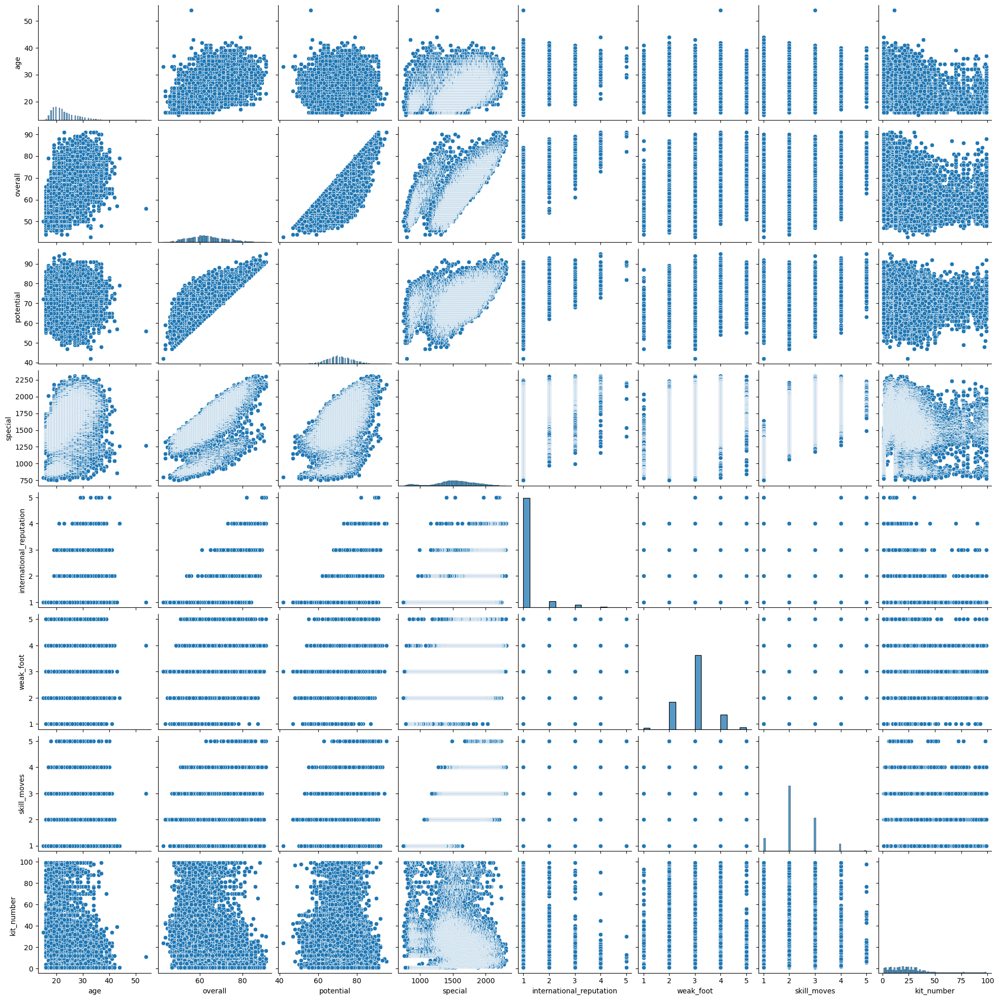

In [160]:
sns.pairplot(df_players[player_numCols])
plt.show()

Al observar la grafica anterior, vamos a dejar para las columnas numericas de interes aquellas que no tienen una distribución tipo campana, para el caso: **`international_reputation`**, **`weak_foot`**, **`skill_moves`** y **`kit_number`**.

In [161]:
player_numCols.remove('international_reputation')
player_numCols.remove('weak_foot')
player_numCols.remove('skill_moves')
player_numCols.remove('kit_number')
player_numCols

['age', 'overall', 'potential', 'special']

Vamos a definir un dataframe **`df`** de trabajo tomando inicialmente las columnas anteriores:

In [162]:
features_selected = player_numCols + ['value', 'wage', 'height', 'weight']
#features_selected
df = df_players[features_selected]
df.head(2)

,age,overall,potential,special,value,wage,height,weight
0,27,87,88,2312,€91M,€115K,189cm,82kg
1,27,86,87,2305,€78.5M,€190K,179cm,69kg


Como las dos ultimas son categoricas las vamos a volver numericas. A continuación se crean las funciones (creadas con la ayuda de Skynet) para tal fin:

In [163]:
def convert_mk_to_numeric(value):
    if isinstance(value, str):  # Asegurar que el valor es una cadena
        if 'M' in value:
            return float(value.replace('M', '')) * 1e6
        elif 'K' in value:
            return float(value.replace('K', '')) * 1e3
        else:
            return float(value)
    return value  # Si no es string, devolver el valor original

def convert_height_to_numeric(height):
    if isinstance(height, str):  # Asegurar que el valor es una cadena
        return float(height.replace('cm', ''))
    return height  # Si no es string, devolver el valor original

def convert_weight_to_numeric(weight):
    if isinstance(weight, str):  # Asegurar que el valor es una cadena
        return float(weight.replace('kg', ''))
    return weight  # Si no es string, devolver el valor original

Aplicando las funciones anteriores para convertir las columnas a numericas tenemos:

In [164]:
# Columna Value
df['value'] = df['value'].str[1:]
df['value']= df['value'].apply(convert_mk_to_numeric)

# Columna Wage
df['wage'] = df['wage'].str[1:]
df['wage'] = df['wage'].apply(convert_mk_to_numeric)

# Columna Height
df['height'] = df['height'].apply(convert_height_to_numeric)

# Columna Weight
df['weight'] = df['weight'].apply(convert_weight_to_numeric)

# Inspeccion del frame
df.head(2)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_24124\914470819.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['value'] = df['value'].str[1:]
C:\Users\Usuario\AppData\Local\Temp\ipykernel_24124\914470819.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['value']= df['value'].apply(convert_mk_to_numeric)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_24124\914470819.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_index

,age,overall,potential,special,value,wage,height,weight
0,27,87,88,2312,91000000.0,115000.0,189.0,82.0
1,27,86,87,2305,78500000.0,190000.0,179.0,69.0


Ahora, analizamos el dataframe definitivo:

In [165]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17660 entries, 0 to 17659
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   age        17660 non-null  int64  
 1   overall    17660 non-null  int64  
 2   potential  17660 non-null  int64  
 3   special    17660 non-null  int64  
 4   value      17660 non-null  float64
 5   wage       17660 non-null  float64
 6   height     17660 non-null  float64
 7   weight     17660 non-null  float64
dtypes: float64(4), int64(4)
memory usage: 1.1 MB


In [166]:
cantidad_valores_unicos = df.nunique()
print(cantidad_valores_unicos)

age            31
overall        49
potential      50
special      1428
value         258
wage          135
height         51
weight         58
dtype: int64


In [129]:
features_selected

['age', 'overall', 'potential', 'special', 'value', 'wage', 'height', 'weight']

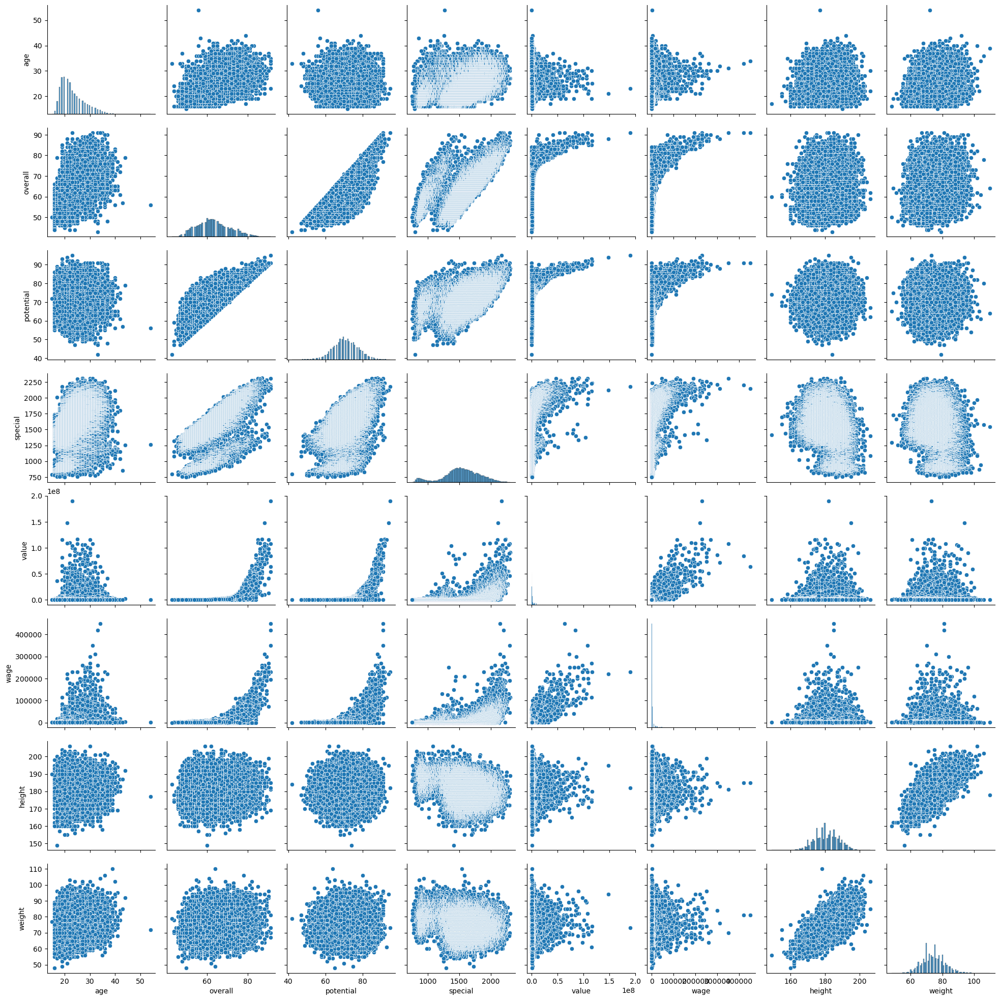

In [110]:
sns.pairplot(df)
plt.show()

#### 3.2. Modelo GMM

In [167]:
# Set random seed for reproducibility
np.random.seed(42)

In [168]:
X = df.values
n, d = X.shape  # Number of samples
print(f"filas: {n}")
print(f"Columnas: {d}")

filas: 17660
Columnas: 8


Inicialización de parametros

In [204]:
# Initialize parameters
K = 4  # Number of clusters
epsilon = 1e-6  # Small value to prevent log(0)

# Normalize data
# X_norm = (X - X.mean(axis=0)) / X.std(axis=0)
scaler = StandardScaler()
X_norm = scaler.fit_transform(X)  # Standardize features

# Mixing coefficients (initial uniform distribution)
pi = np.ones(K) / K  

# Initialize means using random samples from data
random_indices = np.random.choice(n, K, replace=False)
mu = X_norm[random_indices, :]

# Initialize covariance matrices
Sigma = np.array([generate_positive_definite_matrix(d) for _ in range(K)])

Iteración 1, Log-Verosimilitud: -643598.9658
Iteración 2, Log-Verosimilitud: -644826.2159
Iteración 3, Log-Verosimilitud: -649994.2586
Iteración 4, Log-Verosimilitud: -669629.7715
Iteración 5, Log-Verosimilitud: -717515.2080
Iteración 6, Log-Verosimilitud: -759891.4213
Iteración 7, Log-Verosimilitud: -775210.7444
Iteración 8, Log-Verosimilitud: -781456.0351
Iteración 9, Log-Verosimilitud: -784758.5295
Iteración 10, Log-Verosimilitud: -786721.5616
Iteración 11, Log-Verosimilitud: -788029.3915
Iteración 12, Log-Verosimilitud: -788986.2042
Iteración 13, Log-Verosimilitud: -789746.6251
Iteración 14, Log-Verosimilitud: -790399.7689
Iteración 15, Log-Verosimilitud: -790995.7253
Iteración 16, Log-Verosimilitud: -791555.4002
Iteración 17, Log-Verosimilitud: -792078.6273
Iteración 18, Log-Verosimilitud: -792554.0687
Iteración 19, Log-Verosimilitud: -792968.9772
Iteración 20, Log-Verosimilitud: -793315.8590
Iteración 21, Log-Verosimilitud: -793594.7163
Iteración 22, Log-Verosimilitud: -793811.76

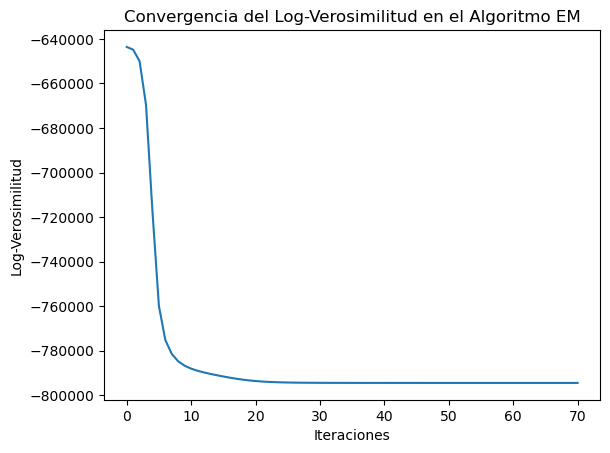

In [205]:
pi_final, mu_final, Sigma_final, gamma_final, log_likelihoods = expectation_maximization(X_norm, mu, Sigma, pi)

In [206]:
# Assign cluster labels based on maximum responsibility
Z = np.argmax(gamma_final, axis=1)
df['cluster'] = Z
df.head()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_24124\3048599808.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['cluster'] = Z


,age,overall,potential,special,value,wage,height,weight,cluster
0,27,87,88,2312,91000000.0,115000.0,189.0,82.0,1
1,27,86,87,2305,78500000.0,190000.0,179.0,69.0,1
2,30,85,85,2303,46500000.0,46000.0,172.0,69.0,2
3,31,91,91,2303,107500000.0,350000.0,181.0,70.0,1
4,25,86,89,2296,89500000.0,110000.0,172.0,68.0,1


In [207]:
df_players['cluster'] = df['cluster']
df_players['cluster'].value_counts()

cluster
0    13610
3     3559
2      353
1      138
Name: count, dtype: int64

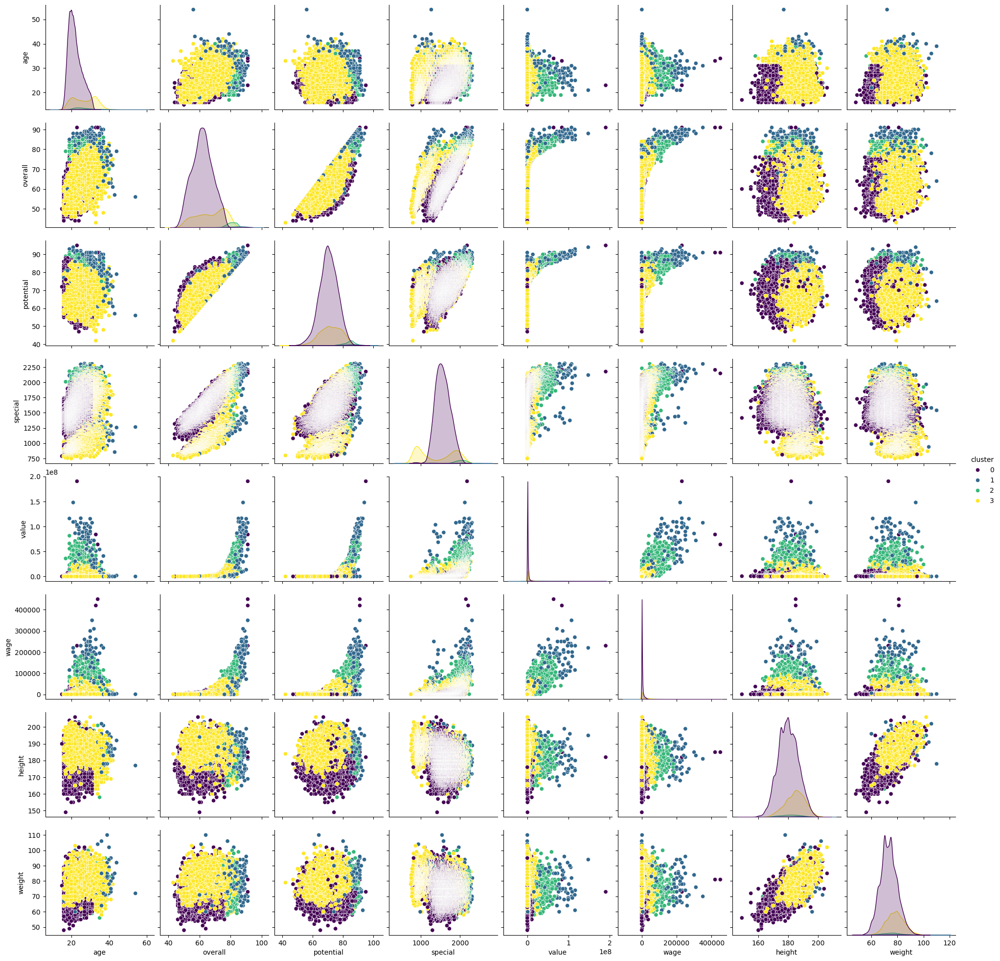

In [209]:
sns.pairplot(df, hue='cluster', palette = 'viridis')
plt.show()

### 3.3. Resultados y conclusiones

To do...

### 4. Dataset aerolineas

La siguiente tabla resume la información del dataset:

| Campo               | Descripción |
|---------------------|-------------|
| ID#                | ID único |
| Balance           | Número de millas elegibles para viajes con premio |
| Qual_miles        | Número de millas que califican para el estatus Topflight |
| cc1_miles        | Número de millas ganadas con la tarjeta de crédito de viajero frecuente en los últimos 12 meses |
| cc2_miles        | Número de millas ganadas con la tarjeta de crédito Rewards en los últimos 12 meses |
| cc3_miles        | Número de millas ganadas con la tarjeta de crédito para pequeñas empresas en los últimos 12 meses |
| Bonus_miles      | Número de millas ganadas por transacciones de bonificación no relacionadas con vuelos en los últimos 12 meses |
| Bonus_trans      | Número de transacciones de bonificación no relacionadas con vuelos en los últimos 12 meses |
| Flight_miles_12mo | Número de millas de vuelo en los últimos 12 meses |
| Flight_trans_12  | Número de transacciones de vuelo en los últimos 12 meses |
| Days_since_enroll | Número de días desde la fecha de inscripción |
| Award?           | Variable indicadora para el último premio (1= no nulo, 0= nulo) |

#### 4.1. Carga de datos

In [315]:
# Se carga el dataset
xlsx_file = 'EastWestAirlines.xlsx'
df_airlines = pd.read_excel(xlsx_file, sheet_name='data')
df_airlines.head(3)

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0


In [316]:
df_airlines.shape

(3999, 12)

In [317]:
df_airlines.columns = df_airlines.columns.str.lower()
df_airlines.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   id#                3999 non-null   int64
 1   balance            3999 non-null   int64
 2   qual_miles         3999 non-null   int64
 3   cc1_miles          3999 non-null   int64
 4   cc2_miles          3999 non-null   int64
 5   cc3_miles          3999 non-null   int64
 6   bonus_miles        3999 non-null   int64
 7   bonus_trans        3999 non-null   int64
 8   flight_miles_12mo  3999 non-null   int64
 9   flight_trans_12    3999 non-null   int64
 10  days_since_enroll  3999 non-null   int64
 11  award?             3999 non-null   int64
dtypes: int64(12)
memory usage: 375.0 KB


In [318]:
# checking the missing values
df_airlines.isnull().sum()

id#                  0
balance              0
qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
bonus_miles          0
bonus_trans          0
flight_miles_12mo    0
flight_trans_12      0
days_since_enroll    0
award?               0
dtype: int64

Como se puede observar en los resultados anteriores podemos llegar a las siguientes conclusiones:
* Todas las caracteristicas son numericas.
* El dataset esta completo ya que no tiene valores nulos.
* La columna asociada al `id` no se usara pues esta relacionada con cada uno de los registros.
* Es importante resaltar mediante el conteo de valores para cada columna la cantidad de datos diferentes, esto con el fin de determinar cuales de estas variables numericas se asocian a una categoria. Esto se hace a continuación.

In [319]:
unique_values_count = df_airlines.nunique()
print(unique_values_count)

id#                  3999
balance              3904
qual_miles            164
cc1_miles               5
cc2_miles               3
cc3_miles               5
bonus_miles          2734
bonus_trans            57
flight_miles_12mo     343
flight_trans_12        35
days_since_enroll    2820
award?                  2
dtype: int64


Como se puede ver en el resultado anterior, hay unas variables que tienen pocos valores diferentes: `cc1_miles`, `cc2_miles`, `cc3_miles`  y `award?`. Estas seran removidas para los procesos que siguen:

In [320]:
# Remove the specified columns
# df2 = df_airlines.drop(columns=['id#','cc1_miles', 'cc2_miles', 'cc3_miles', 'award?'])
# df2 = df_airlines.drop(columns=['qual_miles','id#','cc1_miles', 'cc2_miles', 'cc3_miles', 'award?'])
# df2 = df_airlines.drop(columns=['balance','qual_miles','id#','cc1_miles', 'cc2_miles', 'cc3_miles', 'award?'])
# df2 = df_airlines.drop(columns=['balance','id#','cc1_miles', 'cc2_miles', 'cc3_miles', 'award?'])
# df2 = df_airlines.drop(columns=['qual_miles','id#', 'bonus_trans', 'cc1_miles', 'cc2_miles', 'cc3_miles', 'award?'])
df2 = df_airlines.drop(columns=['qual_miles','id#','cc1_miles', 'cc2_miles', 'cc3_miles', 'award?'])


# Display the updated DataFrame
df2.head(3)

,balance,bonus_miles,bonus_trans,flight_miles_12mo,flight_trans_12,days_since_enroll
0,28143,174,1,0,0,7000
1,19244,215,2,0,0,6968
2,41354,4123,4,0,0,7034


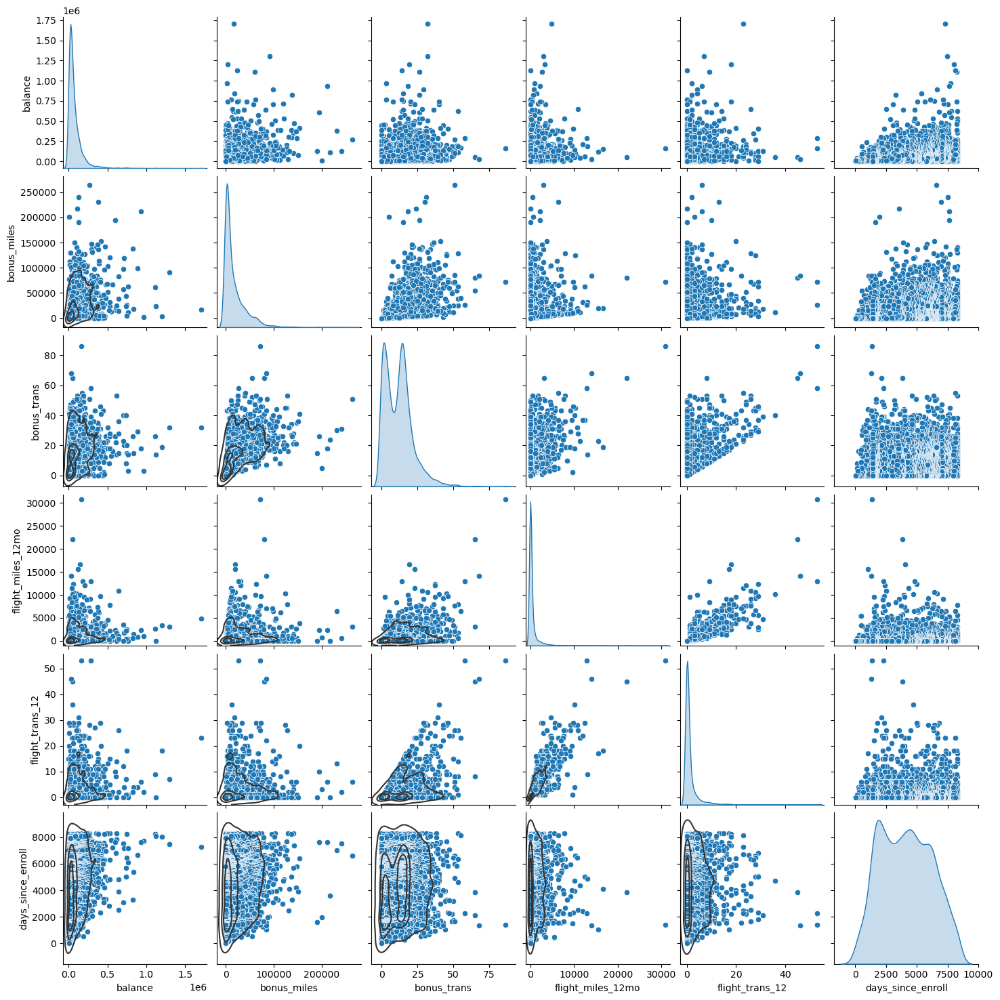

In [321]:
g = sns.pairplot(df2, diag_kind="kde")
g.map_lower(sns.kdeplot, levels=4, color=".2")

#### 4.2. GMM

In [323]:
try:
    df2.drop(['cluster'], axis=1, inplace=True)
except KeyError:
    pass
df2.head(3)

,balance,bonus_miles,bonus_trans,flight_miles_12mo,flight_trans_12,days_since_enroll
0,28143,174,1,0,0,7000
1,19244,215,2,0,0,6968
2,41354,4123,4,0,0,7034


In [324]:
# Set random seed for reproducibility
np.random.seed(42)
# np.random.seed(np.random.randint(0, 1000))

In [325]:
# Initialize parameters
K = 4  # Number of clusters
X2 = df2.values
n, d = X2.shape  # Number of samples
print(f"filas: {n}")
print(f"Columnas: {d}")
print(f"Numero de clusters: {K}")

filas: 3999
Columnas: 6
Numero de clusters: 4


In [326]:
epsilon = 1e-6  # Small value to prevent log(0)

# Create a scaler object
scaler = StandardScaler()

# Normalize data
# X2_norm = (X2 - X2.mean(axis=0)) / X2.std(axis=0)
X2_norm = scaler.fit_transform(X2)


# Mixing coefficients (initial uniform distribution)
pi2 = np.ones(K) / K 

# Initialize means using random samples from data
random_indices = np.random.choice(n, K, replace=False)
mu2 = X2_norm[random_indices, :]
# Initialize covariance matrices
Sigma2 = np.array([generate_positive_definite_matrix(d) for _ in range(K)])

Iteración 1, Log-Verosimilitud: -139106.9710
Iteración 2, Log-Verosimilitud: -151477.6804
Iteración 3, Log-Verosimilitud: -164052.8377
Iteración 4, Log-Verosimilitud: -170245.3296
Iteración 5, Log-Verosimilitud: -172760.0881
Iteración 6, Log-Verosimilitud: -174012.4168
Iteración 7, Log-Verosimilitud: -174659.5398
Iteración 8, Log-Verosimilitud: -174983.6516
Iteración 9, Log-Verosimilitud: -175140.5663
Iteración 10, Log-Verosimilitud: -175213.8809
Iteración 11, Log-Verosimilitud: -175246.2893
Iteración 12, Log-Verosimilitud: -175258.9890
Iteración 13, Log-Verosimilitud: -175262.3805
Iteración 14, Log-Verosimilitud: -175261.5470
Iteración 15, Log-Verosimilitud: -175258.9643
Iteración 16, Log-Verosimilitud: -175255.8260
Iteración 17, Log-Verosimilitud: -175252.6915
Iteración 18, Log-Verosimilitud: -175249.8059
Iteración 19, Log-Verosimilitud: -175247.2585
Iteración 20, Log-Verosimilitud: -175245.0635
Iteración 21, Log-Verosimilitud: -175243.2004
Iteración 22, Log-Verosimilitud: -175241.63

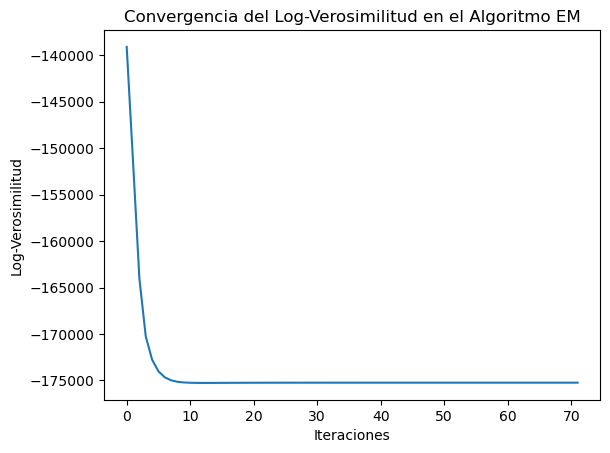

In [327]:
pi2_final, mu2_final, Sigma2_final, gamma2_final, log_likelihoods = expectation_maximization(X2_norm, mu2, Sigma2, pi2)

In [328]:
# Assign cluster labels based on maximum responsibility
Z2 = np.argmax(gamma2_final, axis=1)
df2['cluster'] = Z2
df2.head()

,balance,bonus_miles,bonus_trans,flight_miles_12mo,flight_trans_12,days_since_enroll,cluster
0,28143,174,1,0,0,7000,0
1,19244,215,2,0,0,6968,0
2,41354,4123,4,0,0,7034,0
3,14776,500,1,0,0,6952,0
4,97752,43300,26,2077,4,6935,0


In [329]:
df_airlines['cluster'] = df2['cluster']
df_airlines['cluster'].value_counts()

cluster
0    3583
3     337
1      54
2      25
Name: count, dtype: int64

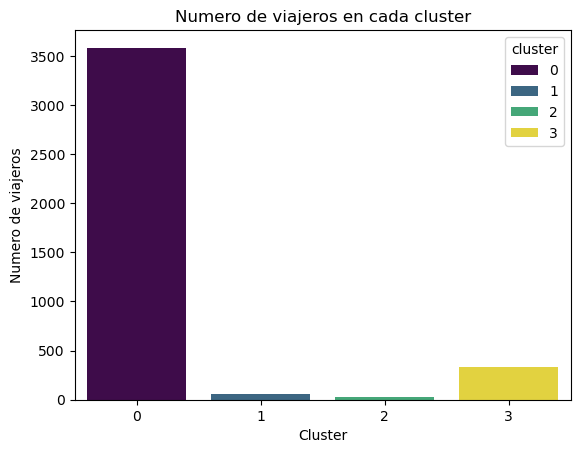

In [331]:
sns.countplot(x='cluster', data=df_airlines, palette='viridis', hue = 'cluster')
plt.xlabel('Cluster')
plt.ylabel('Numero de viajeros')
plt.title('Numero de viajeros en cada cluster')
plt.show()

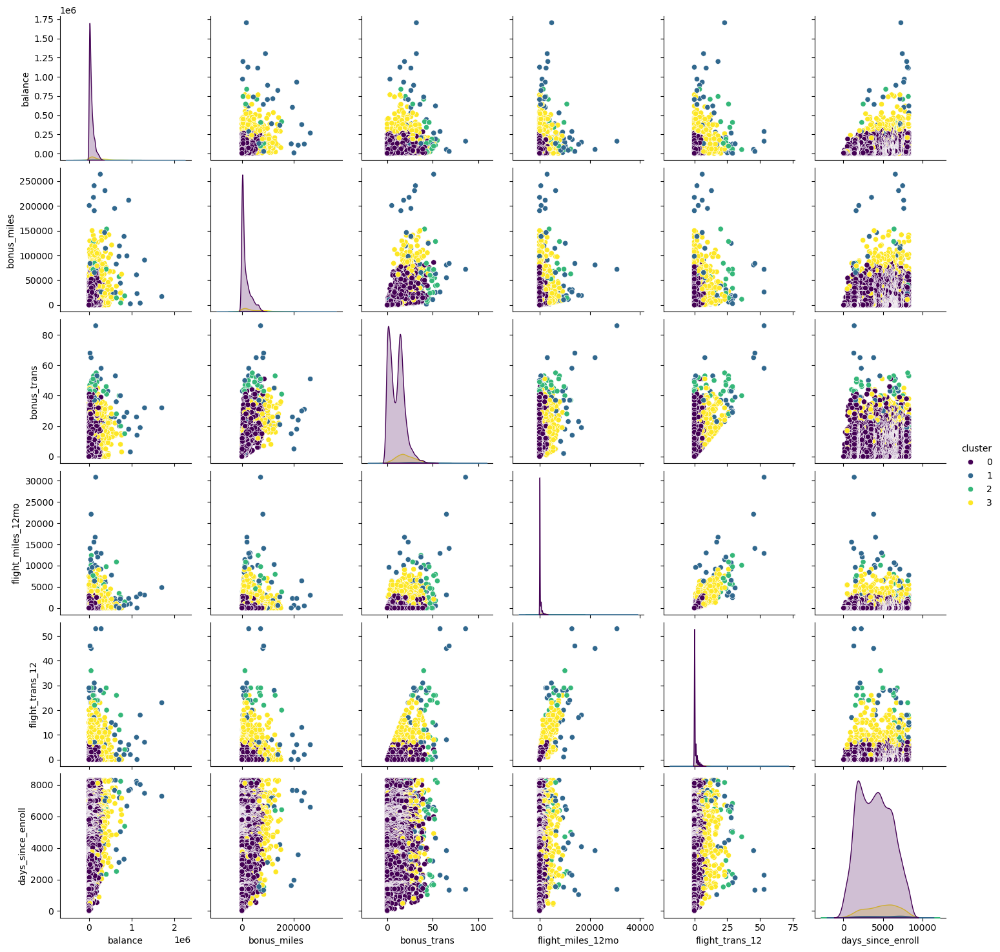

In [332]:
sns.pairplot(df2, hue='cluster', palette = 'viridis')
plt.show()

https://github.com/atwyburde/East-West-Airlines-Analysis/blob/main/Code/Clustering%20-%20East%20West%20Airlines.ipynb

### 4. GMM

#### 4.1. Fifa 23 dataset

In [145]:
# Set random seed for reproducibility
np.random.seed(42)

In [146]:
X = df.values
X

array([[ 27.,  87.,  88., ..., 189.,  82.,   3.],
       [ 27.,  86.,  87., ..., 179.,  69.,   3.],
       [ 30.,  85.,  85., ..., 172.,  69.,   3.],
       ...,
       [ 25.,  51.,  56., ..., 190.,  82.,   2.],
       [ 18.,  50.,  65., ..., 187.,  79.,   2.],
       [ 20.,  50.,  61., ..., 186.,  78.,   2.]])

In [55]:
# Initialize parameters
K = 4  # Number of clusters
n, d = X.shape
epsilon = 1e-6  # Small value to prevent log(0)

# Create a scaler object
scaler = StandardScaler()

# Normalize data
# X_norm = (X - X.mean(axis=0)) / X.std(axis=0)
X_norm = scaler.fit_transform(X)


# Mixing coefficients (initial uniform distribution)
pi = np.ones(K) / K  

In [56]:
# Initialize means using random samples from data
random_indices = np.random.choice(n, K, replace=False)
mu = X_norm[random_indices, :]
# Initialize covariance matrices
Sigma = np.array([generate_positive_definite_matrix(d) for _ in range(K)])

Aplicación del algoritmo EM

Iteration 1, Log-Likelihood: -643274.6067
Iteration 2, Log-Likelihood: -643615.2327
Iteration 3, Log-Likelihood: -645019.6854
Iteration 4, Log-Likelihood: -649634.6676
Iteration 5, Log-Likelihood: -661709.0325
Iteration 6, Log-Likelihood: -683931.1962
Iteration 7, Log-Likelihood: -710477.0241
Iteration 8, Log-Likelihood: -733939.9754
Iteration 9, Log-Likelihood: -750343.6164
Iteration 10, Log-Likelihood: -765537.8088
Iteration 11, Log-Likelihood: -780659.9312
Iteration 12, Log-Likelihood: -793891.8347
Iteration 13, Log-Likelihood: -803913.9236
Iteration 14, Log-Likelihood: -807334.4706
Iteration 15, Log-Likelihood: -808213.8362
Iteration 16, Log-Likelihood: -808465.0171
Iteration 17, Log-Likelihood: -808537.7453
Iteration 18, Log-Likelihood: -808552.9380
Iteration 19, Log-Likelihood: -808548.7615
Iteration 20, Log-Likelihood: -808538.7370
Iteration 21, Log-Likelihood: -808527.8997
Iteration 22, Log-Likelihood: -808518.0676
Iteration 23, Log-Likelihood: -808509.7747
Iteration 24, Log-Li

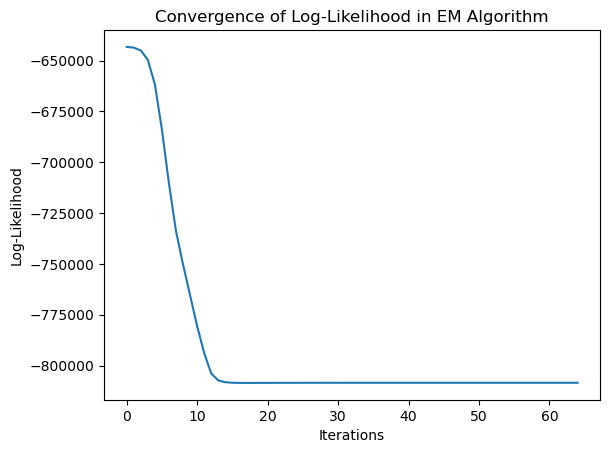

In [57]:
# EM Algorithm for GMM
max_iters = 200  # Maximum iterations
tol = 1e-4  # Convergence threshold
log_likelihoods = []
prev_log_likelihood = -np.inf  # Initialize with a very low value

for i in range(max_iters):
    gamma = expectation_step(X_norm, mu, Sigma, pi)
    pi, mu, Sigma = maximization_step(X_norm, gamma)

    # Compute log-likelihood
    log_likelihood = compute_log_likelihood(X_norm, pi, mu, Sigma)
    log_likelihoods.append(log_likelihood)

    print(f"Iteration {i+1}, Log-Likelihood: {log_likelihood:.4f}")

    # Check for convergence
    if np.abs(log_likelihood - prev_log_likelihood) < tol:
        print(f"Converged at iteration {i+1}.")
        break
    prev_log_likelihood = log_likelihood

# Plot log-likelihood evolution
plt.plot(log_likelihoods)
plt.xlabel('Iterations')
plt.ylabel('Log-Likelihood')
plt.title('Convergence of Log-Likelihood in EM Algorithm')
plt.show()

# Assign cluster labels based on maximum responsibility
Z = np.argmax(gamma, axis=1)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_13508\1016164147.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['cluster'] = Z


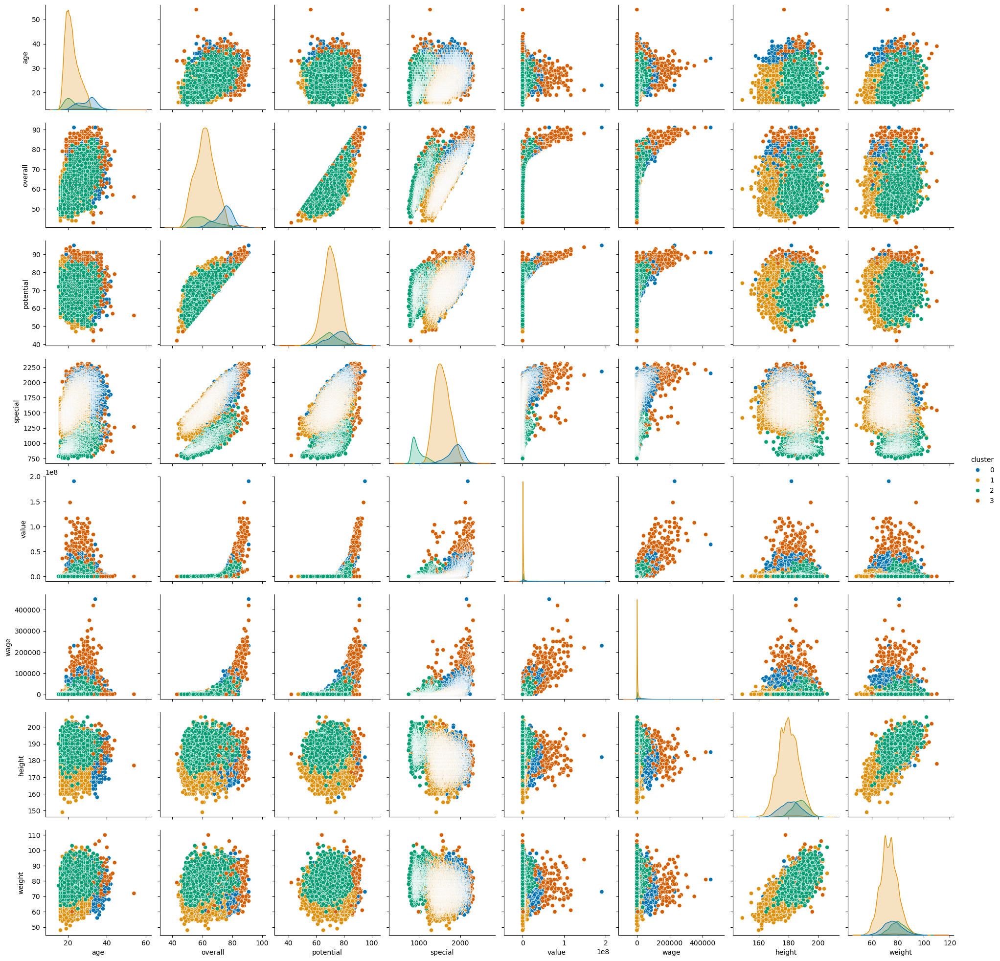

In [58]:
# Assuming 'Z' contains the cluster labels obtained from the GMM algorithm
# and 'df' is your DataFrame with the relevant features
# Create a new column in the DataFrame to store the cluster labels
df['cluster'] = Z

sns.pairplot(df, hue='cluster', palette = 'colorblind')
plt.show()

In [59]:
df.head(5)

,age,overall,potential,special,value,wage,height,weight,cluster
0,27,87,88,2312,91000000.0,115000.0,189.0,82.0,3
1,27,86,87,2305,78500000.0,190000.0,179.0,69.0,3
2,30,85,85,2303,46500000.0,46000.0,172.0,69.0,3
3,31,91,91,2303,107500000.0,350000.0,181.0,70.0,3
4,25,86,89,2296,89500000.0,110000.0,172.0,68.0,3


In [60]:
df_players['cluster'] = df['cluster']
df_players.head()

,id,name,age,photo,nationality,flag,overall,potential,club,club_logo,...,position,joined,loaned_from,contract_valid_until,height,weight,release_clause,kit_number,best_overall_rating,cluster
0,209658,L. Goretzka,27,https://cdn.sofifa.net/players/209/658/23_60.png,Germany,https://cdn.sofifa.net/flags/de.png,87,88,FC Bayern München,https://cdn.sofifa.net/teams/21/30.png,...,"<span class=""pos pos28"">SUB","Jul 1, 2018",NaN,2026,189cm,82kg,€157M,8.0,NaN,3
1,212198,Bruno Fernandes,27,https://cdn.sofifa.net/players/212/198/23_60.png,Portugal,https://cdn.sofifa.net/flags/pt.png,86,87,Manchester United,https://cdn.sofifa.net/teams/11/30.png,...,"<span class=""pos pos15"">LCM","Jan 30, 2020",NaN,2026,179cm,69kg,€155M,8.0,NaN,3
2,224334,M. Acuña,30,https://cdn.sofifa.net/players/224/334/23_60.png,Argentina,https://cdn.sofifa.net/flags/ar.png,85,85,Sevilla FC,https://cdn.sofifa.net/teams/481/30.png,...,"<span class=""pos pos7"">LB","Sep 14, 2020",NaN,2024,172cm,69kg,€97.7M,19.0,NaN,3
3,192985,K. De Bruyne,31,https://cdn.sofifa.net/players/192/985/23_60.png,Belgium,https://cdn.sofifa.net/flags/be.png,91,91,Manchester City,https://cdn.sofifa.net/teams/10/30.png,...,"<span class=""pos pos13"">RCM","Aug 30, 2015",NaN,2025,181cm,70kg,€198.9M,17.0,NaN,3
4,224232,N. Barella,25,https://cdn.sofifa.net/players/224/232/23_60.png,Italy,https://cdn.sofifa.net/flags/it.png,86,89,Inter,https://cdn.sofifa.net/teams/44/30.png,...,"<span class=""pos pos13"">RCM","Sep 1, 2020",NaN,2026,172cm,68kg,€154.4M,23.0,NaN,3


In [61]:
df_players['cluster'].value_counts()

cluster
1    13408
0     2181
2     1826
3      245
Name: count, dtype: int64

C:\Users\Usuario\AppData\Local\Temp\ipykernel_13508\3407213609.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='cluster', data=df_players, palette='colorblind')


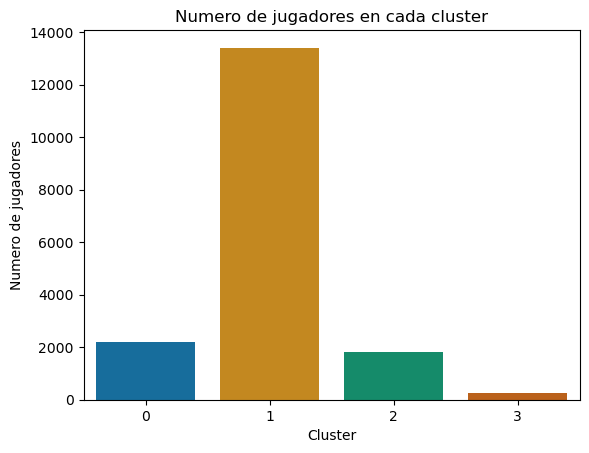

In [62]:
sns.countplot(x='cluster', data=df_players, palette='colorblind')
plt.xlabel('Cluster')
plt.ylabel('Numero de jugadores')
plt.title('Numero de jugadores en cada cluster')
plt.show()

In [73]:
# Agrupar por cluster y calcular estadísticas descriptivas
cluster_summary = df.groupby('cluster').agg(['min', 'mean', 'max', 'std']).round(2)

# Mostrar la tabla
cluster_summary

age                  overall                  potential         ...  \
        min   mean max   std     min   mean max   std       min   mean  ...   
cluster                                                                 ...   
0        19  29.78  42  4.49      53  74.09  91  5.51        53  75.42  ...   
1        16  21.95  32  3.43      44  61.64  81  6.48        47  70.26  ...   
2        15  22.99  38  4.85      46  60.90  85  8.08        50  69.29  ...   
3        17  29.52  54  6.35      43  80.81  91  8.14        42  83.48  ...   

             wage           height                      weight                \
              max       std    min    mean    max   std    min   mean    max   
cluster                                                                        
0        450000.0  28284.04  158.0  181.22  201.0  6.50   56.0  76.00   98.0   
1         43000.0   5286.71  149.0  179.85  206.0  6.67   48.0  73.18  102.0   
2         80000.0   9626.06  165.0  187.82  206.0  5.22   60.0  80.21  103.0   
3        420000.0  82805.47  163.0  183.29  203.0  7.62   59.0  78.46  110.0   

               
          std  
cluster        
0        6.87  
1        6.55  
2        6.28  
3        9.08  

[4 rows x 32 columns]

In [ ]:
# Agrupar por cluster y calcular estadísticas descriptivas
players_num_cluster_summary = df_players.groupby('cluster').mean(numeric_only=True).round(2)

# Mostrar la tabla
players_num_cluster_summary

,id,age,overall,potential,special,international_reputation,weak_foot,skill_moves,kit_number
cluster,,,,,,,,,
0,204442.87,29.78,74.09,75.42,1866.15,1.56,3.20,2.93,18.03
1,254133.19,21.95,61.64,70.26,1555.92,1.01,2.91,2.36,25.93
2,246562.13,22.99,60.90,69.29,975.89,1.07,2.45,1.01,28.03
3,189676.88,29.52,80.81,83.48,1819.38,2.53,3.31,2.73,16.02


In [78]:
# Agrupar por cluster y calcular estadísticas descriptivas
players_cat_cluster_summary = df_players.groupby('cluster').describe(exclude=[np.number]).round(2)

# Mostrar la tabla
players_cat_cluster_summary

name                                photo         \
         count unique               top freq  count unique   
cluster                                                      
0         2181   2173  22 R. Funes Mori    2   2181   2181   
1        13408  13085    21 A. González    4  13408  13408   
2         1826   1823            Adrián    2   1826   1826   
3          245    245       L. Goretzka    1    245    245   

                                                               nationality  \
                                                      top freq       count   
cluster                                                                      
0        https://cdn.sofifa.net/players/187/961/22_60.png    1        2181   
1        https://cdn.sofifa.net/players/235/008/23_60.png    1       13408   
2        https://cdn.sofifa.net/players/204/638/23_60.png    1        1826   
3        https://cdn.sofifa.net/players/209/658/23_60.png    1         245   

                ... weight       release_clause                       \
        unique  ...    top  freq          count unique      top freq   
cluster         ...                                                    
0          109  ...   75kg   156           1975    633    €1.2M   28   
1          157  ...   70kg  1346          12621    820    €1.2M  463   
2           97  ...   80kg   176           1704    586    €1.1M   63   
3           51  ...   75kg    17            209    189  €133.2M    2   

        best_overall_rating                                                 \
                      count unique                                     top   
cluster                                                                      
0                         0      0                                     NaN   
1                        11      8  <span class="bp3-tag p p-65">65</span>   
2                         7      5  <span class="bp3-tag p p-64">64</span>   
3                         3      3  <span class="bp3-tag p p-78">78</span>   

              
        freq  
cluster       
0        NaN  
1          2  
2          2  
3          1  

[4 rows x 80 columns]

In [82]:
selected_cat_cols = ['nationality', 'work_rate', 'position', 'preferred_foot']
# Filter the DataFrame to include only the categorical columns
categorical_columns = df_players[selected_cat_cols].select_dtypes(include=['object']).columns.tolist()

# Group by cluster and show unique values for each categorical column
unique_categorical_values = df_players.groupby('cluster')[selected_cat_cols].agg(lambda x: x.unique().tolist())

# Display the unique values for each cluster for categorical data
print(unique_categorical_values)

                                               nationality  \
cluster                                                      
0        [Brazil, Germany, Spain, Argentina, Uruguay, F...   
1        [Argentina, Netherlands, Brazil, United States...   
2        [Hungary, United States, France, Morocco, Spai...   
3        [Germany, Portugal, Argentina, Belgium, Italy,...   

                                                 work_rate  \
cluster                                                      
0        [High/ High, Medium/ High, High/ Medium, High/...   
1        [Medium/ High, High/ High, Medium/ Medium, Hig...   
2        [Medium/ Medium, Medium/ High, N/A/ N/A, Low/ ...   
3        [High/ Medium, High/ High, Medium/ Medium, Med...   

                                                  position preferred_foot  
cluster                                                                    
0        [<span class="pos pos15">LCM, <span class="pos...  [Right, Left]  
1        [<span class="pos

C:\Users\Usuario\AppData\Local\Temp\ipykernel_13508\1381034775.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='cluster', y='age', data=df, palette='colorblind')


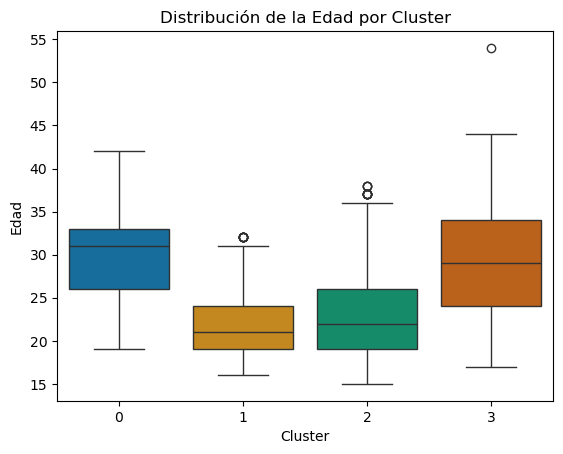

In [94]:
sns.boxplot(x='cluster', y='age', data=df, palette='colorblind')
plt.xlabel('Cluster')
plt.ylabel('Edad')
plt.title('Distribución de la Edad por Cluster')
plt.show()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_13508\1960108635.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='cluster', y=feature, data=df, ax=axes[i], palette='colorblind')
C:\Users\Usuario\AppData\Local\Temp\ipykernel_13508\1960108635.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='cluster', y=feature, data=df, ax=axes[i], palette='colorblind')
C:\Users\Usuario\AppData\Local\Temp\ipykernel_13508\1960108635.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='cluster', y=feature, data=df, ax=axes[i], palette='co

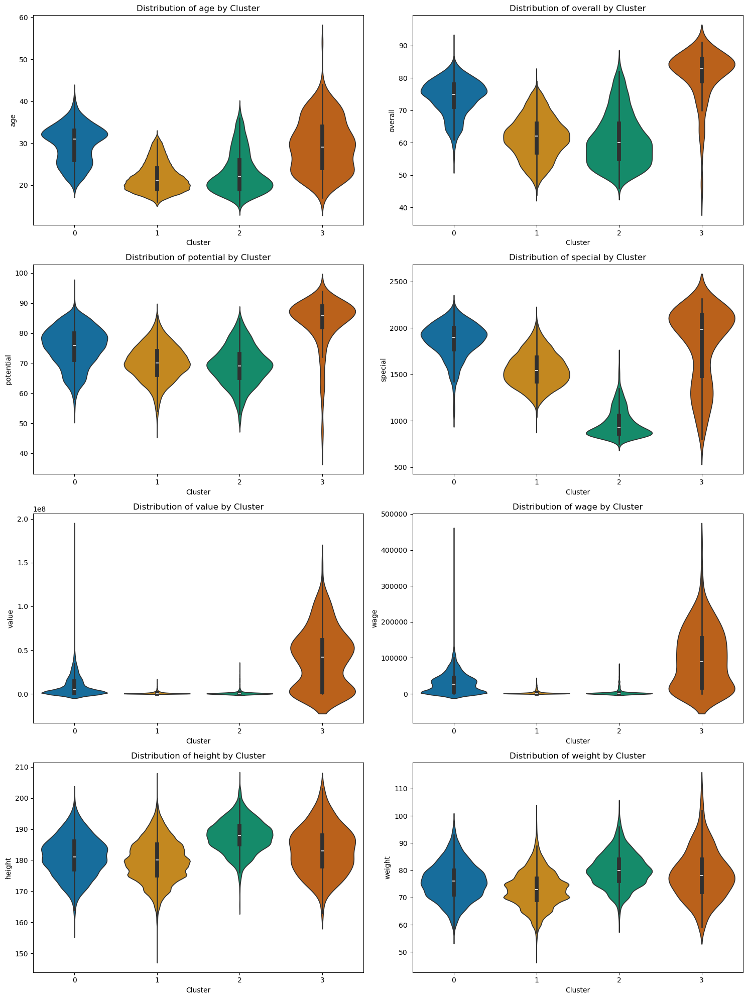

In [97]:
# Number of columns for subplots
num_cols = 2

# Calculate the number of rows needed
num_rows = (num_features + num_cols - 1) // num_cols

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, num_rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot each feature
for i, feature in enumerate(features):
    # sns.boxplot(x='cluster', y=feature, data=df, ax=axes[i], palette='colorblind')
    sns.violinplot(x='cluster', y=feature, data=df, ax=axes[i], palette='colorblind')    
    axes[i].set_title(f'Distribution of {feature} by Cluster')
    axes[i].set_xlabel('Cluster')
    axes[i].set_ylabel(feature)

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

#### 4.2. East West Airlines

In [243]:
df2.head(3)

,balance,bonus_miles,bonus_trans,flight_miles_12mo,flight_trans_12,days_since_enroll
0,28143,174,1,0,0,7000
1,19244,215,2,0,0,6968
2,41354,4123,4,0,0,7034


In [244]:
# Set random seed for reproducibility
np.random.seed(42)

In [245]:
X2 = df2.values
X2

array([[28143,   174,     1,     0,     0,  7000],
       [19244,   215,     2,     0,     0,  6968],
       [41354,  4123,     4,     0,     0,  7034],
       ...,
       [73597, 25447,     8,     0,     0,  1402],
       [54899,   500,     1,   500,     1,  1401],
       [ 3016,     0,     0,     0,     0,  1398]], dtype=int64)

In [246]:
# Initialize parameters
K = 6  # Number of clusters
n, d = X2.shape
epsilon = 1e-6  # Small value to prevent log(0)

# Create a scaler object
scaler = StandardScaler()

# Normalize data
# X_norm = (X - X.mean(axis=0)) / X.std(axis=0)
X2_norm = scaler.fit_transform(X2)


# Mixing coefficients (initial uniform distribution)
pi = np.ones(K) / K 

In [247]:
# Initialize means using random samples from data
random_indices = np.random.choice(n, K, replace=False)
mu = X2_norm[random_indices, :]
# Initialize covariance matrices
Sigma = np.array([generate_positive_definite_matrix(d) for _ in range(K)])

Iteration 1, Log-Likelihood: -210060.4096
Iteration 2, Log-Likelihood: -226819.2373
Iteration 3, Log-Likelihood: -253433.1824
Iteration 4, Log-Likelihood: -268081.5056
Iteration 5, Log-Likelihood: -273616.9055
Iteration 6, Log-Likelihood: -276631.2200
Iteration 7, Log-Likelihood: -278399.6327
Iteration 8, Log-Likelihood: -279361.0209
Iteration 9, Log-Likelihood: -279842.3812
Iteration 10, Log-Likelihood: -280076.3069
Iteration 11, Log-Likelihood: -280190.2169
Iteration 12, Log-Likelihood: -280245.8240
Iteration 13, Log-Likelihood: -280272.4568
Iteration 14, Log-Likelihood: -280284.3864
Iteration 15, Log-Likelihood: -280288.8032
Iteration 16, Log-Likelihood: -280289.4438
Iteration 17, Log-Likelihood: -280288.2878
Iteration 18, Log-Likelihood: -280286.3877
Iteration 19, Log-Likelihood: -280284.2940
Iteration 20, Log-Likelihood: -280282.2815
Iteration 21, Log-Likelihood: -280280.4740
Iteration 22, Log-Likelihood: -280278.9138
Iteration 23, Log-Likelihood: -280277.6009
Iteration 24, Log-Li

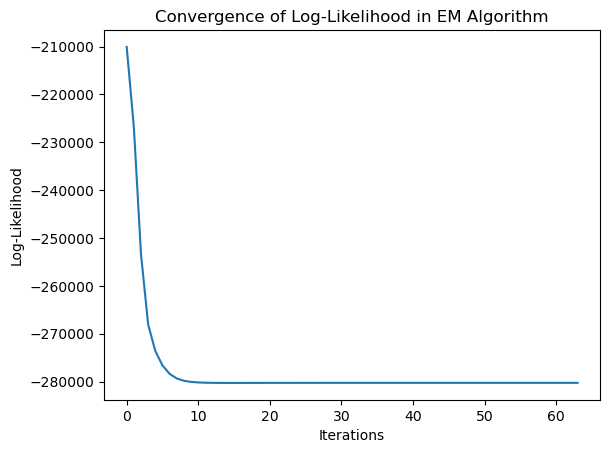

In [248]:
# EM Algorithm for GMM
max_iters = 200  # Maximum iterations
tol = 1e-4  # Convergence threshold
log_likelihoods = []
prev_log_likelihood = -np.inf  # Initialize with a very low value

for i in range(max_iters):
    gamma = expectation_step(X2_norm, mu, Sigma, pi)
    pi, mu, Sigma = maximization_step(X2_norm, gamma)

    # Compute log-likelihood
    log_likelihood = compute_log_likelihood(X2_norm, pi, mu, Sigma)
    log_likelihoods.append(log_likelihood)

    print(f"Iteration {i+1}, Log-Likelihood: {log_likelihood:.4f}")

    # Check for convergence
    if np.abs(log_likelihood - prev_log_likelihood) < tol:
        print(f"Converged at iteration {i+1}.")
        break
    prev_log_likelihood = log_likelihood

# Plot log-likelihood evolution
plt.plot(log_likelihoods)
plt.xlabel('Iterations')
plt.ylabel('Log-Likelihood')
plt.title('Convergence of Log-Likelihood in EM Algorithm')
plt.show()

# Assign cluster labels based on maximum responsibility
Z2 = np.argmax(gamma, axis=1)

In [255]:
# Assuming 'Z' contains the cluster labels obtained from the GMM algorithm
# and 'df' is your DataFrame with the relevant features
# Create a new column in the DataFrame to store the cluster labels
df2['cluster'] = Z2

In [252]:
df_airlines['cluster'] = df2['cluster']
df_airlines.head()

,id#,balance,qual_miles,cc1_miles,cc2_miles,cc3_miles,bonus_miles,bonus_trans,flight_miles_12mo,flight_trans_12,days_since_enroll,award?,cluster
0,1,28143,0,1,1,1,174,1,0,0,7000,0,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1,0


In [253]:
df_airlines['cluster'].value_counts()

cluster
0    3490
4     409
1      40
5      26
3      18
2      16
Name: count, dtype: int64

C:\Users\Usuario\AppData\Local\Temp\ipykernel_13508\582275589.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='cluster', data=df_airlines, palette='colorblind')


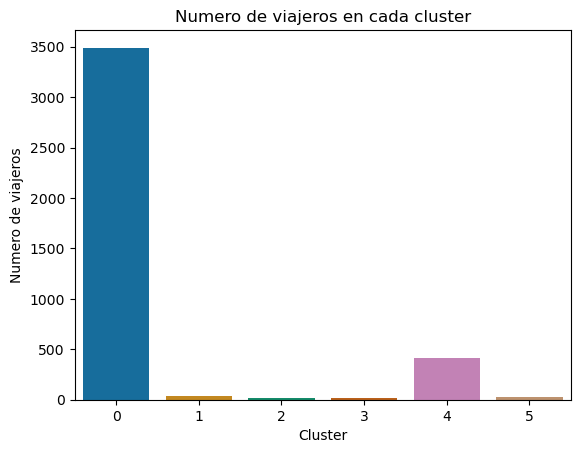

In [254]:
sns.countplot(x='cluster', data=df_airlines, palette='colorblind')
plt.xlabel('Cluster')
plt.ylabel('Numero de viajeros')
plt.title('Numero de viajeros en cada cluster')
plt.show()

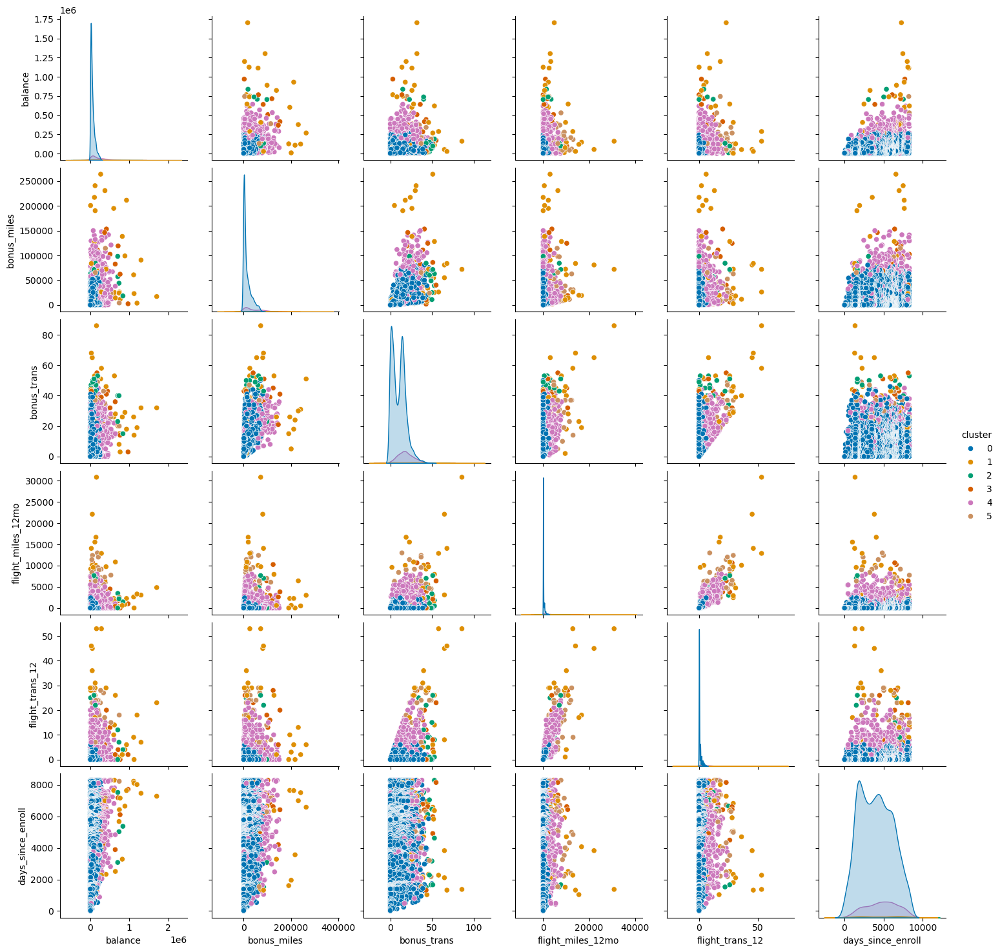

In [ ]:
sns.pairplot(df2, hue='cluster', palette = 'colorblind')
plt.show()

In [250]:
df_airlines['cluster'] = df2['cluster']
df_airlines.head()

,id#,balance,qual_miles,cc1_miles,cc2_miles,cc3_miles,bonus_miles,bonus_trans,flight_miles_12mo,flight_trans_12,days_since_enroll,award?,cluster
0,1,28143,0,1,1,1,174,1,0,0,7000,0,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1,0


In [251]:
df_airlines['cluster'].value_counts()

cluster
0    3490
4     409
1      40
5      26
3      18
2      16
Name: count, dtype: int64

C:\Users\Usuario\AppData\Local\Temp\ipykernel_13508\590798359.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='cluster', data=df_airlines, palette='colorblind')


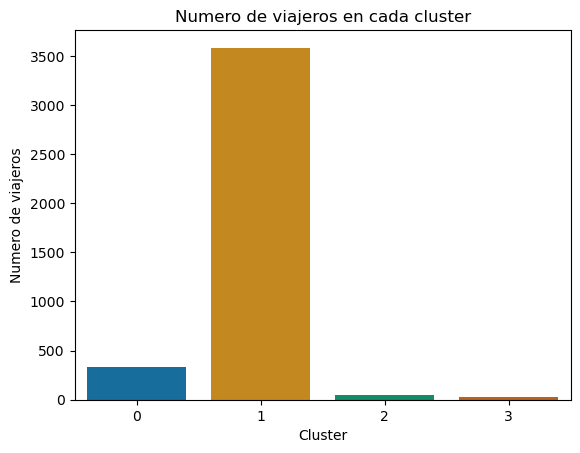

In [160]:

sns.countplot(x='cluster', data=df_airlines, palette='colorblind')
plt.xlabel('Cluster')
plt.ylabel('Numero de viajeros')
plt.title('Numero de viajeros en cada cluster')
plt.show()

### Conclusiones

* Necesidad de hacer limpieza de datos.